In [1]:
from tqdm import tqdm
import pandas as pd
import sklearn

import numpy as np
import cv2
import os
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from keras.utils.np_utils import to_categorical
import scipy

In [2]:
# Constant Variables
IMAGE_SIZE = 299
VALIDATION_SIZE = 0.5
TEST_SIZE = 0.2
CATEGORIES = ["COVID", "Lung_Opacity", "Normal", "Viral Pneumonia"]

In [3]:
def prepare_data():
    # Loading train data and splitting into train, test and validation
    X = np.load('features_299.npy')
    y = np.load('labels_299.npy')


    # Printing some information of data
    print("\Data shape     :", X.shape, y.shape)
    print('Output classes          :', np.unique(y))
    print('Total number of outputs :', len(np.unique(y)))

    plt.figure(figsize=[5, 5])
    plt.subplot(121)
    plt.imshow(X[0, :, :], cmap='gray')
    plt.title("Ground Truth : {}".format(y[0]))
    plt.show()
    plt.subplot(122)
    plt.imshow(X[0, :, :], cmap='gray')
    plt.title("Ground Truth : {}".format(y[0]))
    plt.show()

    # Data preprocessing
    X = X.astype(np.uint8)


    X = X.reshape(-1, IMAGE_SIZE, IMAGE_SIZE, 1)
    
    # One-hot encoding conversion
    #print("\nOriginal label              :", y)
    #y = to_categorical(y)
    #print("After conversion to one-hot :", y)

    print("\nData shape     :", X.shape, y.shape)


    data = (X,y)

    return data

In [4]:
def plot_images(*arg):
    fig, axs = plt.subplots(1,len(arg))
    fig.set_figheight(15)
    fig.set_figwidth(15)
    
    
    for i in range(0,len(arg)):
        axs[i].imshow(arg[i], cmap='gray')

\Data shape     : (21165, 299, 299) (21165,)
Output classes          : [0 1 2 3]
Total number of outputs : 4


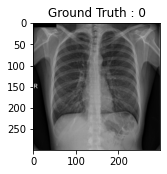

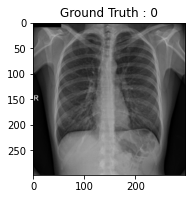


Data shape     : (21165, 299, 299, 1) (21165,)


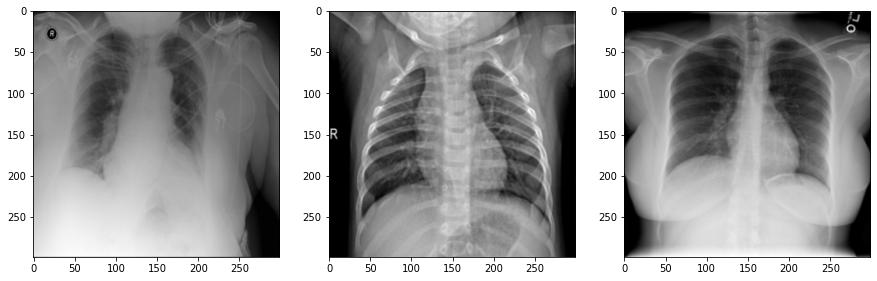

In [5]:
# Reading dataset
dataset = prepare_data()

X = dataset[0]
y = dataset[1]

# Plotting some examples
plot_images(X[1], X[2], X[3])

In [6]:
# Cropping to ROI
def crop(img):
    """
    Crop ROI from image.
    """

    # Otsu's thresholding after Gaussian filtering
    blur = cv2.GaussianBlur(img,(5,5),0)
    _, breast_mask = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    cnts, _ = cv2.findContours(breast_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnt = max(cnts, key = cv2.contourArea)
    x, y, w, h = cv2.boundingRect(cnt)
    img = img[y:y+h, x:x+w]
    img = cv2.resize(img, dsize=(IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_CUBIC)
    return img


X = [crop(i) for i in X]

In [7]:
from skimage.transform import resize
from skimage.feature import hog
from skimage.feature import greycomatrix, greycoprops
from skimage import data

def extract_features(img):
    # Color moments
    features = {'moment_mean': np.mean(img),
                'moment_var': np.var(img),
                'moment_skew': scipy.stats.skew(img.reshape(-1)),
                'moment_kurtosis': scipy.stats.kurtosis(img.reshape(-1)),
                'moment_min': np.min(img.reshape(-1)),
                'moment_max': np.max(img.reshape(-1)),}
    
    
    # Histogram
    histogram = cv2.calcHist([img], [0], None, [256], [0,256])
    for index,value in enumerate(histogram):
        features['hist_{}'.format(index)] = (value[0].reshape(-1)/img.size)
    
    
    # Hog features 
    resized_img = cv2.resize(img, (128,64)) 
    hog_features = hog(resized_img, orientations=9, pixels_per_cell=(32, 32), 
                        cells_per_block=(2, 2), feature_vector=True)
    for index,value in enumerate(hog_features):
        features['hog_{}'.format(index)] = value
    
    
    # Canny Edge Detection
    # Blur the imag for better edge detection
    blurred_img = cv2.GaussianBlur(img, (5,5), 0)
    edges = cv2.Canny(blurred_img, 5, 25)
    features['edges_mean'] = np.mean(edges)
    features['edges_var'] =np.var(edges)
    features['edges_skew'] = scipy.stats.skew(edges.reshape(-1))
    features['edges_kurtosis'] = scipy.stats.kurtosis(edges.reshape(-1))
    
    
    # SIFT   
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(img,None)
    
    if(len(kp) > 0):
        des = des.reshape(-1)
        features['sift_mean'] = np.mean(des)
        features['sift_var'] =np.var(des)
        features['sift_skew'] = scipy.stats.skew(des.reshape(-1))
        features['sift_kurtosis'] = scipy.stats.kurtosis(des.reshape(-1))
    else:
        features['sift_mean'] = 0
        features['sift_var'] = 0
        features['sift_skew'] = 0
        features['sift_kurtosis'] = 0
    
    
    
    # Gray Level Cooccurence Matrix
    PATCH_SIZE = 42
    dot1 = int(IMAGE_SIZE*0.75) - 10
    dot2 = int(IMAGE_SIZE/4) - 20
    dot3 = int(IMAGE_SIZE/2) - 10
    locations = [(dot1, dot2), (dot1, dot1), (dot2, dot2),(dot2, dot1), (dot3, dot2), (dot3, dot1)]
    patches = []
    for loc in locations:
        patches.append(img[loc[0]:loc[0] + PATCH_SIZE,
                                   loc[1]:loc[1] + PATCH_SIZE])
    for index, patch in enumerate(patches):
        features['glcm_mean_{}'.format(index)] = np.mean(patch)
        features['glcm_var_{}'.format(index)] =np.var(patch)
        features['glcm_skew_{}'.format(index)] = scipy.stats.skew(patch.reshape(-1))
        features['glcm_kurtosis_{}'.format(index)] = scipy.stats.kurtosis(patch.reshape(-1))
        features['glcm_min_{}'.format(index)] = np.min(patch.reshape(-1))
        features['glcm_max_{}'.format(index)] = np.max(patch.reshape(-1))
    
    return features

In [8]:
features = [extract_features(img) for img in tqdm(X)]

100%|██████████| 21165/21165 [11:46<00:00, 29.95it/s]


In [9]:
features

[{'moment_mean': 76.9201574926455,
  'moment_var': 1698.0698211897238,
  'moment_skew': -0.13909519141038573,
  'moment_kurtosis': -0.8294966886902602,
  'moment_min': 0,
  'moment_max': 233,
  'hist_0': array([0.0134003]),
  'hist_1': array([0.0037919]),
  'hist_2': array([0.0037919]),
  'hist_3': array([0.00463082]),
  'hist_4': array([0.0061185]),
  'hist_5': array([0.00884778]),
  'hist_6': array([0.01260612]),
  'hist_7': array([0.02309818]),
  'hist_8': array([0.02642029]),
  'hist_9': array([0.01310947]),
  'hist_10': array([0.00335567]),
  'hist_11': array([0.0020134]),
  'hist_12': array([0.00105144]),
  'hist_13': array([0.00123041]),
  'hist_14': array([0.00091722]),
  'hist_15': array([0.00087247]),
  'hist_16': array([0.00101789]),
  'hist_17': array([0.0017002]),
  'hist_18': array([0.00142057]),
  'hist_19': array([0.00110737]),
  'hist_20': array([0.00128634]),
  'hist_21': array([0.00119685]),
  'hist_22': array([0.00112974]),
  'hist_23': array([0.00142057]),
  'hist_

In [10]:
# To show and save features, dataframes are used
features_df = pd.DataFrame.from_dict(features)

# Scaling all values for machine learning algorithms
scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(0,1))
scaled_features = pd.DataFrame(scaler.fit_transform(features_df.values), columns=features_df.columns)
#scaled_features.to_csv('features.csv',index=False)

X = scaled_features.values

In [11]:
scaled_features

,moment_mean,moment_var,moment_skew,moment_kurtosis,moment_min,moment_max,hist_0,hist_1,hist_2,hist_3,...,glcm_skew_4,glcm_kurtosis_4,glcm_min_4,glcm_max_4,glcm_mean_5,glcm_var_5,glcm_skew_5,glcm_kurtosis_5,glcm_min_5,glcm_max_5
0,0.225919,0.160651,0.530869,0.025469,0.000000,0.888325,0.050395,0.017049,0.025723,0.024872,...,0.579883,0.085786,0.146245,0.293023,0.288177,0.081597,0.643388,0.033380,0.174603,0.486239
1,0.508819,0.201121,0.534450,0.025304,0.206107,0.847716,0.000000,0.000000,0.000000,0.000000,...,0.626338,0.076111,0.324111,0.586047,0.468954,0.029716,0.452960,0.046204,0.313492,0.518349
2,0.398370,0.317812,0.461270,0.033863,0.000000,0.994924,0.313646,0.007594,0.013203,0.010093,...,0.704360,0.177999,0.126482,0.920930,0.401662,0.249332,0.640569,0.048683,0.123016,0.986239
3,0.492828,0.401252,0.502013,0.021207,0.000000,0.979695,0.086951,0.011064,0.017680,0.022589,...,0.632234,0.059306,0.249012,0.734884,0.489989,0.267757,0.614890,0.014372,0.250000,0.807339
4,0.580461,0.146123,0.520298,0.021070,0.000000,1.000000,0.000084,0.000000,0.000152,0.000060,...,0.579630,0.033892,0.339921,0.539535,0.578671,0.038512,0.557085,0.010325,0.472222,0.665138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21160,0.657245,0.120900,0.300429,0.148312,0.068702,0.959391,0.000000,0.000000,0.000000,0.000000,...,0.607506,0.046692,0.418972,0.609302,0.709049,0.010605,0.516972,0.031679,0.642857,0.761468
21161,0.505012,0.457083,0.440262,0.038441,0.000000,0.984772,0.395255,0.007896,0.008650,0.005047,...,0.670456,0.108742,0.300395,0.813953,0.537292,0.173805,0.609315,0.023001,0.321429,0.834862
21162,0.618684,0.302860,0.508218,0.021232,0.129771,0.939086,0.000000,0.000000,0.000000,0.000000,...,0.468491,0.062714,0.343874,0.841860,0.708541,0.055155,0.514499,0.022821,0.539683,0.830275
21163,0.604572,0.346512,0.513418,0.021838,0.000000,0.949239,0.005006,0.000503,0.000683,0.000541,...,0.608474,0.015050,0.332016,0.767442,0.552974,0.053265,0.530812,0.040409,0.353175,0.743119


Accuracy:  0.7995275218521143
Recall:  0.768619638485809
Precision:  0.8258446667730122
F1 Score :  0.7932430481577571
Cohens Kappa :  0.6850835753424729


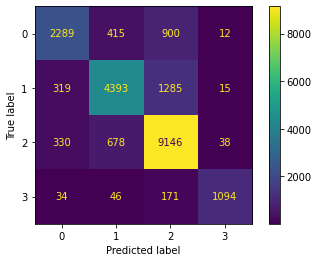

In [13]:
# confusion matrix accuracy precision recall f1 kappa
# SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, cohen_kappa_score, f1_score
from sklearn.svm import SVC

svc_clf = SVC(C=0.1, gamma= 1, kernel='linear')
y_predicted = cross_val_predict(svc_clf, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

[03:32:23] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:34:40] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:37:02] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:39:24] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

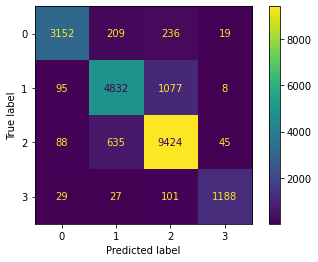

In [14]:
# confusion matrix accuracy precision recall f1 kappa
# XGBOOST
from xgboost import XGBClassifier


xgb_clf = XGBClassifier(max_depth=9, min_child_weight=5, gamma=0.0, use_label_encoder=False)
y_predicted = cross_val_predict(xgb_clf, X, y, cv=5, )

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

Accuracy:  0.7193952279707063
Recall:  0.6941397495886116
Precision:  0.6986192472810866
F1 Score :  0.6962857458465389
Cohens Kappa :  0.5696078652052183


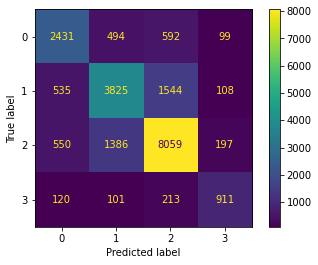

In [18]:
# DecisionTree
from sklearn.tree import DecisionTreeClassifier


dtree_clf = DecisionTreeClassifier(criterion='entropy', splitter='best', max_depth=15)
y_predicted = cross_val_predict(dtree_clf, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

Accuracy:  0.8317977793527049
Recall:  0.8081702025949382
Precision:  0.8605459434124749
F1 Score :  0.8311848761176113
Cohens Kappa :  0.7365657975688173


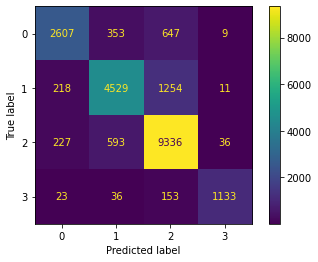

In [19]:
# confusion matrix accuracy precision recall f1 kappa
# SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, cohen_kappa_score, f1_score
from sklearn.svm import SVC

svc_clf2 = SVC(C=1, gamma= 'scale', kernel='rbf')
y_predicted = cross_val_predict(svc_clf2, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

Accuracy:  0.8455468934561776
Recall:  0.8237886307973392
Precision:  0.8755788456642292
F1 Score :  0.8469650450082005
Cohens Kappa :  0.7590734158880573


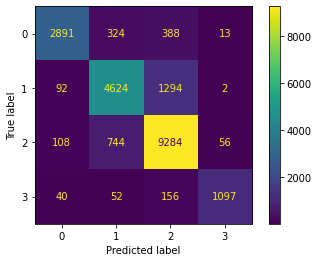

In [20]:
# confusion matrix accuracy precision recall f1 kappa
# Random Forest
from sklearn.ensemble import RandomForestClassifier

ran_forest = RandomForestClassifier(n_estimators=100, criterion='entropy')
y_predicted = cross_val_predict(ran_forest, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

Accuracy:  0.803921568627451
Recall:  0.7853312125182507
Precision:  0.8190322162679775
F1 Score :  0.8004593996112295
Cohens Kappa :  0.6946948824247998


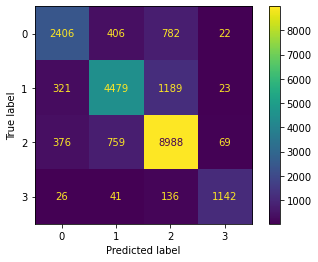

In [27]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(max_iter=800, solver='saga')
y_predicted = cross_val_predict(logistic, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

Accuracy:  0.7986298133711316
Recall:  0.7737036890292235
Precision:  0.8174359527468916
F1 Score :  0.7923135322870534
Cohens Kappa :  0.6845769119273392


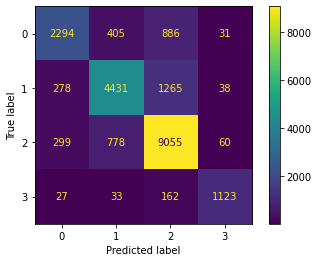

In [26]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
y_predicted = cross_val_predict(lda, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

Accuracy:  0.822206472950626
Recall:  0.7877821841030339
Precision:  0.8617182114619156
F1 Score :  0.8183328512450785
Cohens Kappa :  0.7185530492245054


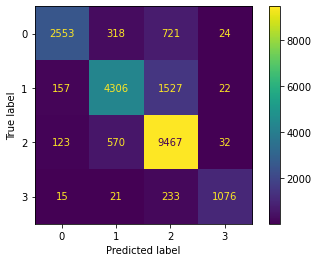

In [28]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=10)
y_predicted = cross_val_predict(knn, X, y, cv=5)

cm_nodelta = confusion_matrix(y, y_predicted)
disp_nodelta = ConfusionMatrixDisplay(confusion_matrix=cm_nodelta)
disp_nodelta.plot()
print("Accuracy: ",accuracy_score(y, y_predicted))
print("Recall: ",recall_score(y, y_predicted, average = 'macro'))
print("Precision: ",precision_score(y, y_predicted, average ='macro'))
print("F1 Score : ",f1_score(y, y_predicted, average='macro'))
print("Cohens Kappa : ",cohen_kappa_score(y, y_predicted))

In [29]:
np.save("x_son", X)
np.save("y_son", y)